## **📦Package Installations**

In [1]:
from IPython.display import display, HTML
from tqdm.notebook import tqdm
import subprocess

# --- Phase 1: Lightweight packages ---
phase1 = [
    "scikit-learn==1.5.2",
    "tabpfn",
    "catboost",
    "xgboost",
    "lightgbm",
    "datasets",
    "ucimlrepo",
    "ace_tools"
]

# --- Phase 2: Heavy or Git-based packages ---
phase2 = [
    "autogluon==0.8.2 --no-cache-dir --upgrade",
    "tabpfn-extensions[all] @ git+https://github.com/PriorLabs/tabpfn-extensions.git"
]

# --- Function to install packages with live output ---
def install_packages(package_list, phase_name):
    logs = []
    display(HTML(f"<h3>🚀 Starting {phase_name}</h3>"))
    for pkg in tqdm(package_list, desc=f"{phase_name}", unit="pkg"):
        display(HTML(f"<b>Installing:</b> {pkg}"))
        process = subprocess.Popen(
            ["pip", "install", "--no-cache-dir", "--upgrade", pkg],
            stdout=subprocess.PIPE,
            stderr=subprocess.STDOUT,
            text=True
        )
        output = ""
        for line in process.stdout:
            output += line
        process.wait()
        logs.append(f"📦 {pkg}\n{output}")
    return logs

# --- Run both phases ---
logs_phase1 = install_packages(phase1, "Phase 1: Core Packages")
logs_phase2 = install_packages(phase2, "Phase 2: Heavy/Git Packages")

# --- Display combined logs ---
all_logs = logs_phase1 + logs_phase2
scrollable_logs = (
    "<pre style='max-height: 400px; overflow-y: scroll; border: 1px solid #ccc; padding: 10px;'>"
    + "\n\n".join(all_logs) + "</pre>"
)
display(HTML(scrollable_logs))

Phase 1: Core Packages:   0%|          | 0/8 [00:00<?, ?pkg/s]

Phase 2: Heavy/Git Packages:   0%|          | 0/2 [00:00<?, ?pkg/s]

In [2]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import catboost as cb
import lightgbm as lgb
import xgboost as xgb
# ---- Unified benchmarking (integrated; with fitted_models) ----
import time
from autogluon.tabular import TabularPredictor
import catboost as cb, lightgbm as lgb, xgboost as xgb
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, log_loss
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Optional imports with fallbacks
# AutoGluon
try:
    from autogluon.tabular import TabularPredictor
    AGLUON_AVAILABLE = True
except ImportError as e:
    print("Warning: AutoGluon import failed:", e)
    AGLUON_AVAILABLE = False

# TabPFN
from tabpfn import TabPFNClassifier
# try:
#   from tabpfn_extensions.post_hoc_ensembles.sklearn_interface import AutoTabPFNClassifier, AutoTabPFNRegressor
# except:
#   raise SystemError('Please restart the session to fix this import.')
from tabpfn_extensions.post_hoc_ensembles.sklearn_interface import AutoTabPFNClassifier

/tmp/ipykernel_36/659467975.py:5: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [3]:
# 3) Load dataset (update the file path as needed)
# heart_disease_dataset = '/kaggle/input/heart-disease-dataset/heart.csv'
# df = pd.read_csv(heart_disease_dataset)

# ada_dataset = '/kaggle/input/seven-datasets-for-classification-test-on-tabpfn/Classification DataSets/ada_dataset.csv'
# df = pd.read_csv(ada_dataset)

# australian_dataset = '/kaggle/input/seven-datasets-for-classification-test-on-tabpfn/Classification DataSets/australian_dataset.csv'
# df = pd.read_csv(australian_dataset)

# blood_transfusion_service_center_dataset = '/kaggle/input/seven-datasets-for-classification-test-on-tabpfn/Classification DataSets/blood_transfusion-service-center.csv'
# df = pd.read_csv(blood_transfusion_service_center_dataset)

# car_dataset = '/kaggle/input/seven-datasets-for-classification-test-on-tabpfn/Classification DataSets/car.csv'
# df = pd.read_csv(car_dataset)

chum_dataset = '/kaggle/input/seven-datasets-for-classification-test-on-tabpfn/Classification DataSets/chum.csv'
df = pd.read_csv(chum_dataset)

# cmc_dataset = '/kaggle/input/seven-datasets-for-classification-test-on-tabpfn/Classification DataSets/cmc.csv'
# df = pd.read_csv(cmc_dataset)

# credit_g_dataset = '/kaggle/input/seven-datasets-for-classification-test-on-tabpfn/Classification DataSets/credit-g.csv'
# df = pd.read_csv(credit_g_dataset)

In [4]:
# 4) Dataset overview and information
print("Shape of the dataset:", df.shape)
df.info()
print("\nFirst few rows:")
display(df.head())
print("\nLast few rows:")
display(df.tail())
print("\nDescriptive statistics:")
display(df.describe(include='all').T)
print("\nMissing values per column:")
display(df.isnull().sum().sort_values(ascending=False))
print("\nMemory usage per column:")
display(df.memory_usage(deep=True))
print("\nUnique value counts per column:")
display(df.nunique())
print("\nData types of each column:")
display(df.dtypes)

Shape of the dataset: (5000, 21)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          5000 non-null   int64  
 1   account_length                 5000 non-null   int64  
 2   area_code                      5000 non-null   int64  
 3   phone_number                   5000 non-null   int64  
 4   international_plan             5000 non-null   int64  
 5   voice_mail_plan                5000 non-null   int64  
 6   number_vmail_messages          5000 non-null   int64  
 7   total_day_minutes              5000 non-null   float64
 8   total_day_calls                5000 non-null   int64  
 9   total_day_charge               5000 non-null   float64
 10  total_eve_minutes              5000 non-null   float64
 11  total_eve_calls                5000 non-null   int64  
 12  total_eve_charg

,state,account_length,area_code,phone_number,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,...,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,target
0,16,128,415,2845,0,1,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
1,35,107,415,2301,0,1,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
2,31,137,415,1616,0,0,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
3,35,84,408,2510,1,0,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
4,36,75,415,155,1,0,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0



Last few rows:


,state,account_length,area_code,phone_number,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,...,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,target
4995,11,50,408,2000,0,1,40,235.7,127,40.07,...,126,18.96,297.5,116,13.39,9.9,5,2.67,2,0
4996,49,152,415,394,0,0,0,184.2,90,31.31,...,73,21.83,213.6,113,9.61,14.7,2,3.97,3,1
4997,7,61,415,313,0,0,0,140.6,89,23.90,...,128,14.69,212.4,97,9.56,13.6,4,3.67,1,0
4998,7,109,510,3471,0,0,0,188.8,67,32.10,...,92,14.59,224.4,89,10.10,8.5,6,2.30,0,0
4999,46,86,415,2412,0,1,34,129.4,102,22.00,...,104,22.70,154.8,100,6.97,9.3,16,2.51,0,0



Descriptive statistics:


,count,mean,std,min,25%,50%,75%,max
state,5000.0,25.998400,14.803480,0.0,13.000,26.00,39.00,50.00
account_length,5000.0,100.258600,39.694560,1.0,73.000,100.00,127.00,243.00
area_code,5000.0,436.911400,42.209182,408.0,408.000,415.00,415.00,510.00
phone_number,5000.0,2499.500000,1443.520003,0.0,1249.750,2499.50,3749.25,4999.00
international_plan,5000.0,0.094600,0.292691,0.0,0.000,0.00,0.00,1.00
voice_mail_plan,5000.0,0.264600,0.441164,0.0,0.000,0.00,1.00,1.00
number_vmail_messages,5000.0,7.755200,13.546393,0.0,0.000,0.00,17.00,52.00
total_day_minutes,5000.0,180.288900,53.894699,0.0,143.700,180.10,216.20,351.50
total_day_calls,5000.0,100.029400,19.831197,0.0,87.000,100.00,113.00,165.00
total_day_charge,5000.0,30.649668,9.162069,0.0,24.430,30.62,36.75,59.76



Missing values per column:


state                            0
account_length                   0
area_code                        0
phone_number                     0
international_plan               0
voice_mail_plan                  0
number_vmail_messages            0
total_day_minutes                0
total_day_calls                  0
total_day_charge                 0
total_eve_minutes                0
total_eve_calls                  0
total_eve_charge                 0
total_night_minutes              0
total_night_calls                0
total_night_charge               0
total_intl_minutes               0
total_intl_calls                 0
total_intl_charge                0
number_customer_service_calls    0
target                           0
dtype: int64


Memory usage per column:


Index                              132
state                            40000
account_length                   40000
area_code                        40000
phone_number                     40000
international_plan               40000
voice_mail_plan                  40000
number_vmail_messages            40000
total_day_minutes                40000
total_day_calls                  40000
total_day_charge                 40000
total_eve_minutes                40000
total_eve_calls                  40000
total_eve_charge                 40000
total_night_minutes              40000
total_night_calls                40000
total_night_charge               40000
total_intl_minutes               40000
total_intl_calls                 40000
total_intl_charge                40000
number_customer_service_calls    40000
target                           40000
dtype: int64


Unique value counts per column:


state                              51
account_length                    218
area_code                           3
phone_number                     5000
international_plan                  2
voice_mail_plan                     2
number_vmail_messages              48
total_day_minutes                1961
total_day_calls                   123
total_day_charge                 1961
total_eve_minutes                1879
total_eve_calls                   126
total_eve_charge                 1659
total_night_minutes              1853
total_night_calls                 131
total_night_charge               1028
total_intl_minutes                170
total_intl_calls                   21
total_intl_charge                 170
number_customer_service_calls      10
target                              2
dtype: int64


Data types of each column:


state                              int64
account_length                     int64
area_code                          int64
phone_number                       int64
international_plan                 int64
voice_mail_plan                    int64
number_vmail_messages              int64
total_day_minutes                float64
total_day_calls                    int64
total_day_charge                 float64
total_eve_minutes                float64
total_eve_calls                    int64
total_eve_charge                 float64
total_night_minutes              float64
total_night_calls                  int64
total_night_charge               float64
total_intl_minutes               float64
total_intl_calls                   int64
total_intl_charge                float64
number_customer_service_calls      int64
target                             int64
dtype: object

### 5. Separate target and features

In [5]:
# Keep target vector separate from X
target = 'target'
if target not in df.columns:
    raise KeyError(f"Target column '{target}' not found in dataframe.")
y = df[target]
X = df.drop(columns=target)

## **5. Data processing**

In [6]:
# 6.1) Identify numerical and categorical columns in X
num_cols = X.select_dtypes(include=[np.number]).columns.tolist()
cat_cols = X.select_dtypes(include=['object', 'category']).columns.tolist()

# 6.2) Handle missing values
num_imputer = SimpleImputer(strategy='median')
X[num_cols] = num_imputer.fit_transform(X[num_cols])
if cat_cols:
    cat_imputer = SimpleImputer(strategy='most_frequent')
    X[cat_cols] = cat_imputer.fit_transform(X[cat_cols])

# 6.3) One-hot encode for processed dataset
if cat_cols:
    X_processed = pd.get_dummies(X, columns=cat_cols, drop_first=True)
else:
    X_processed = X.copy()

# 6.4) Z-normalization on processed numeric features
scaled_cols = [col for col in num_cols if col in X_processed.columns]
X_processed[scaled_cols] = X_processed[scaled_cols].apply(lambda col: (col - col.mean()) / col.std())

# 6.5) Raw encoded features (no scaling)
if cat_cols:
    X_raw = pd.get_dummies(X, columns=cat_cols, drop_first=True)
else:
    X_raw = X.copy()

In [7]:
# 6.4) Z-normalization on processed numeric features
scaled_cols = [col for col in num_cols if col in X_processed.columns]
X_processed[scaled_cols] = X_processed[scaled_cols].apply(lambda col: (col - col.mean()) / col.std())

In [8]:
# 6.5) Raw encoded features (no scaling)
if cat_cols:
    X_raw = pd.get_dummies(X, columns=cat_cols, drop_first=True)
else:
    X_raw = X.copy()

In [9]:
# 7) Train-test split on processed and raw data
processed_X_train, processed_X_test, processed_y_train, processed_y_test = train_test_split(
    X_processed, y, test_size=0.2, random_state=42
)
print("Processed train/test shapes:", processed_X_train.shape, processed_X_test.shape)

raw_X_train, raw_X_test, raw_y_train, raw_y_test = train_test_split(
    X_raw, y, test_size=0.2, random_state=42
)
print("Raw encoded train/test shapes:", raw_X_train.shape, raw_X_test.shape)

Processed train/test shapes: (4000, 20) (1000, 20)
Raw encoded train/test shapes: (4000, 20) (1000, 20)


In [10]:
raw_X_train.head(5)

,state,account_length,area_code,phone_number,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
4227,21.0,119.0,510.0,867.0,0.0,0.0,0.0,73.7,66.0,12.53,160.5,132.0,13.64,214.2,67.0,9.64,13.0,6.0,3.51,3.0
4676,12.0,200.0,415.0,2304.0,1.0,1.0,29.0,92.2,95.0,15.67,200.0,101.0,17.00,119.1,99.0,5.36,5.7,1.0,1.54,1.0
800,23.0,96.0,415.0,135.0,0.0,1.0,27.0,261.3,96.0,44.42,220.9,101.0,18.78,179.4,97.0,8.07,11.3,2.0,3.05,1.0
3671,11.0,141.0,510.0,2767.0,0.0,0.0,0.0,138.2,94.0,23.49,176.4,84.0,14.99,182.9,110.0,8.23,11.1,6.0,3.00,3.0
4193,4.0,136.0,510.0,843.0,0.0,0.0,0.0,132.4,110.0,22.51,254.1,81.0,21.60,176.5,100.0,7.94,13.0,6.0,3.51,2.0


In [11]:
processed_X_train.head(5)

,state,account_length,area_code,phone_number,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
4227,-0.337650,0.472140,1.731581,-1.130916,-0.323208,-0.599777,-0.572492,-1.977725,-1.715953,-1.977683,-0.793977,1.604368,-0.794612,0.273283,-1.649367,0.273673,0.991607,0.636929,0.991000,1.094336
4676,-0.945615,2.512722,-0.519115,-0.135433,3.093366,1.666953,1.568299,-1.634463,-0.253611,-1.634966,-0.012592,0.040804,-0.012642,-1.608850,-0.046055,-1.608669,-1.651983,-1.398248,-1.651473,-0.436632
800,-0.202547,-0.107284,-0.519115,-1.638010,-0.323208,1.666953,1.420659,1.503137,-0.203185,1.502972,0.400849,0.040804,0.401615,-0.415447,-0.146262,-0.416812,0.375977,-0.991213,0.373976,-0.436632
3671,-1.013167,1.026372,1.731581,0.185311,-0.323208,-0.599777,-0.572492,-0.780947,-0.304036,-0.781447,-0.479445,-0.816634,-0.480428,-0.346178,0.505083,-0.346444,0.303549,0.636929,0.306908,1.094336
4193,-1.486029,0.900411,1.731581,-1.147542,-0.323208,-0.599777,-0.572492,-0.888564,0.502773,-0.888409,1.057607,-0.967947,1.057911,-0.472841,0.004048,-0.473986,0.991607,0.636929,0.991000,0.328852


In [12]:
processed_y_train.head(5)

4227    0
4676    1
800     0
3671    0
4193    0
Name: target, dtype: int64

In [13]:
raw_y_train.head(20)

4227    0
4676    1
800     0
3671    0
4193    0
2968    1
4793    0
4368    0
2776    0
2970    0
3867    0
1743    0
3948    0
3802    0
2024    0
2274    0
99      1
4921    1
3407    0
4245    0
Name: target, dtype: int64

In [14]:
# --- Sanity checks & cleanup helpers ---
import numpy as np
import pandas as pd

def sanitize_df(df: pd.DataFrame) -> pd.DataFrame:
    # Convert inf to NaN so the imputer can handle them
    return df.replace([np.inf, -np.inf], np.nan)

def nan_report(df: pd.DataFrame, top_n: int = 20):
    na = df.isna().sum()
    if na.sum() == 0:
        print("No NaNs found in X ✅")
        return
    print(f"{(na>0).sum()} columns contain NaNs. Showing top {top_n}:")
    display(pd.DataFrame({
        "NaNs": na[na>0].sort_values(ascending=False).head(top_n),
        "% rows": (na/len(df)*100).round(2)[na>0].sort_values(ascending=False).head(top_n)
    }))

# Apply once to the training data you already have
processed_X_train = sanitize_df(processed_X_train)
nan_report(processed_X_train)

# (Do the same for your validation/test splits later)
# processed_X_valid = sanitize_df(processed_X_valid)
# processed_X_test  = sanitize_df(processed_X_test)

No NaNs found in X ✅



## Benchmark: classification metrics and timing
We evaluate TabPFN, AutoTabPFN, AutoGluon, CatBoost, LightGBM, and XGBoost on **raw** and **processed** datasets.
Metrics reported: **ROC‑AUC, Accuracy, F1 (↑)** and **Cross‑Entropy (CE), ECE (↓)**. Fit time is shown separately.


In [15]:
def to_1d(a):
    if hasattr(a, "values"):
        a = a.values
    a = np.asarray(a)
    return a.ravel()

def prob_pos_from_estimator(estimator, X):
    """Return P(class=1) as 1D numpy array if available; else None."""
    try:
        proba = estimator.predict_proba(X)
    except Exception:
        return None
    if isinstance(proba, pd.DataFrame):
        if 1 in proba.columns:
            return to_1d(proba[1])
        return to_1d(proba.iloc[:, -1])
    if isinstance(proba, pd.Series):
        return to_1d(proba)
    proba = np.asarray(proba)
    if proba.ndim == 2 and proba.shape[1] >= 2:
        return to_1d(proba[:, -1])
    if proba.ndim == 1:
        return to_1d(proba)
    return None

def expected_calibration_error(y_true, y_prob, n_bins=15):
    try:
        y_true = to_1d(y_true).astype(int)
        y_prob = np.clip(to_1d(y_prob).astype(float), 1e-12, 1-1e-12)
    except Exception:
        return np.nan
    bins = np.linspace(0.0, 1.0, n_bins + 1)
    bin_ids = np.digitize(y_prob, bins) - 1
    ece = 0.0; n = len(y_true)
    for b in range(n_bins):
        in_bin = bin_ids == b
        m = in_bin.sum()
        if m == 0:
            continue
        acc = (y_true[in_bin] == (y_prob[in_bin] >= 0.5)).mean()
        conf = y_prob[in_bin].mean()
        ece += (m / n) * abs(acc - conf)
    return float(ece)

def safe_log_loss(y_true, y_prob):
    try:
        yp = np.clip(to_1d(y_prob), 1e-12, 1-1e-12)
        y2 = np.column_stack([1 - yp, yp])
        return float(log_loss(to_1d(y_true), y2))
    except Exception:
        try:
            return float(log_loss(to_1d(y_true), to_1d(y_prob)))
        except Exception:
            return np.nan

#### **Trouble shooting**

In [16]:
# Expect these objects to be present from earlier cells:
# processed_X_train, processed_X_test, processed_y_train, processed_y_test
# raw_X_train, raw_X_test, raw_y_train, raw_y_test

datasets = {
    'processed': (processed_X_train, processed_X_test, processed_y_train, processed_y_test),
    'raw': (raw_X_train, raw_X_test, raw_y_train, raw_y_test)
}

results = []
fitted_models = {}  # save trained models: key = (model_name, dataset)

for ds_name, (X_tr, X_te, y_tr, y_te) in datasets.items():
    # Numpy views where needed
    Xtr_np, Xte_np = getattr(X_tr, "values", X_tr), getattr(X_te, "values", X_te)
    ytr_np, yte_np = to_1d(y_tr), to_1d(y_te)

    # TabPFN (expects numpy)
    mdl = TabPFNClassifier(random_state=42)
    t0 = time.time(); mdl.fit(Xtr_np, ytr_np); ft = time.time() - t0
    fitted_models[('TabPFN', ds_name)] = mdl
    y_pred = mdl.predict(Xte_np); y_prob = prob_pos_from_estimator(mdl, Xte_np)
    results.append({'dataset': ds_name, 'model': 'TabPFN', 'fit_time': ft,
                    'Accuracy': accuracy_score(yte_np, y_pred),
                    'ROC_AUC': roc_auc_score(yte_np, y_prob) if y_prob is not None else np.nan,
                    'F1': f1_score(yte_np, y_pred),
                    'CE': safe_log_loss(yte_np, y_prob) if y_prob is not None else np.nan,
                    'ECE': expected_calibration_error(yte_np, y_prob) if y_prob is not None else np.nan})

    # Random Forest
    mdl = RandomForestClassifier(random_state=42, n_estimators=200)
    t0 = time.time(); mdl.fit(X_tr, y_tr); ft = time.time() - t0
    fitted_models[('RandomForest', ds_name)] = mdl
    y_pred = mdl.predict(X_te); y_prob = prob_pos_from_estimator(mdl, X_te)
    results.append({'dataset': ds_name, 'model': 'RandomForest', 'fit_time': ft,
                    'Accuracy': accuracy_score(yte_np, to_1d(y_pred)),
                    'ROC_AUC': roc_auc_score(yte_np, y_prob) if y_prob is not None else np.nan,
                    'F1': f1_score(yte_np, to_1d(y_pred)),
                    'CE': safe_log_loss(yte_np, y_prob) if y_prob is not None else np.nan,
                    'ECE': expected_calibration_error(yte_np, y_prob) if y_prob is not None else np.nan})

    # Support Vector Machine (needs probability=True)
    mdl = SVC(probability=True, random_state=42)
    t0 = time.time(); mdl.fit(X_tr, y_tr); ft = time.time() - t0
    fitted_models[('SVM', ds_name)] = mdl
    y_pred = mdl.predict(X_te); y_prob = prob_pos_from_estimator(mdl, X_te)
    results.append({'dataset': ds_name, 'model': 'SVM', 'fit_time': ft,
                    'Accuracy': accuracy_score(yte_np, to_1d(y_pred)),
                    'ROC_AUC': roc_auc_score(yte_np, y_prob) if y_prob is not None else np.nan,
                    'F1': f1_score(yte_np, to_1d(y_pred)),
                    'CE': safe_log_loss(yte_np, y_prob) if y_prob is not None else np.nan,
                    'ECE': expected_calibration_error(yte_np, y_prob) if y_prob is not None else np.nan})

    # MLP
    mdl = MLPClassifier(hidden_layer_sizes=(100,), max_iter=300, random_state=42)
    t0 = time.time(); mdl.fit(X_tr, y_tr); ft = time.time() - t0
    fitted_models[('MLP', ds_name)] = mdl
    y_pred = mdl.predict(X_te); y_prob = prob_pos_from_estimator(mdl, X_te)
    results.append({'dataset': ds_name, 'model': 'MLP', 'fit_time': ft,
                    'Accuracy': accuracy_score(yte_np, to_1d(y_pred)),
                    'ROC_AUC': roc_auc_score(yte_np, y_prob) if y_prob is not None else np.nan,
                    'F1': f1_score(yte_np, to_1d(y_pred)),
                    'CE': safe_log_loss(yte_np, y_prob) if y_prob is not None else np.nan,
                    'ECE': expected_calibration_error(yte_np, y_prob) if y_prob is not None else np.nan})

    # Logistic Regression
    mdl = LogisticRegression(max_iter=1000, solver='lbfgs', random_state=42)
    t0 = time.time(); mdl.fit(X_tr, y_tr); ft = time.time() - t0
    fitted_models[('LogisticRegression', ds_name)] = mdl
    y_pred = mdl.predict(X_te); y_prob = prob_pos_from_estimator(mdl, X_te)
    results.append({'dataset': ds_name, 'model': 'LogisticRegression', 'fit_time': ft,
                    'Accuracy': accuracy_score(yte_np, to_1d(y_pred)),
                    'ROC_AUC': roc_auc_score(yte_np, y_prob) if y_prob is not None else np.nan,
                    'F1': f1_score(yte_np, to_1d(y_pred)),
                    'CE': safe_log_loss(yte_np, y_prob) if y_prob is not None else np.nan,
                    'ECE': expected_calibration_error(yte_np, y_prob) if y_prob is not None else np.nan})

    # AutoTabPFN (expects numpy)
    mdl = AutoTabPFNClassifier(random_state=42)
    t0 = time.time(); mdl.fit(Xtr_np, ytr_np); ft = time.time() - t0
    fitted_models[('AutoTabPFN', ds_name)] = mdl
    y_pred = mdl.predict(Xte_np); y_prob = prob_pos_from_estimator(mdl, Xte_np)
    results.append({'dataset': ds_name, 'model': 'AutoTabPFN', 'fit_time': ft,
                    'Accuracy': accuracy_score(yte_np, y_pred),
                    'ROC_AUC': roc_auc_score(yte_np, y_prob) if y_prob is not None else np.nan,
                    'F1': f1_score(yte_np, y_pred),
                    'CE': safe_log_loss(yte_np, y_prob) if y_prob is not None else np.nan,
                    'ECE': expected_calibration_error(yte_np, y_prob) if y_prob is not None else np.nan})

    # AutoGluon (TabularPredictor)
    label_col = getattr(y_tr, "name", None) or "target"
    ag_train = X_tr.copy()
    ag_train[label_col] = y_tr.values if hasattr(y_tr, "values") else y_tr
    t0 = time.time()
    predictor = TabularPredictor(label=label_col, eval_metric='accuracy').fit(ag_train, verbosity=0)
    ft = time.time() - t0
    fitted_models[('AutoGluon', ds_name)] = predictor
    y_pred = predictor.predict(X_te)
    proba = predictor.predict_proba(X_te)
    if isinstance(proba, pd.DataFrame):
        y_prob = to_1d(proba.iloc[:, -1])
    elif isinstance(proba, pd.Series):
        y_prob = to_1d(proba)
    else:
        y_prob = None
    results.append({'dataset': ds_name, 'model': 'AutoGluon', 'fit_time': ft,
                    'Accuracy': accuracy_score(yte_np, to_1d(y_pred)),
                    'ROC_AUC': roc_auc_score(yte_np, y_prob) if y_prob is not None else np.nan,
                    'F1': f1_score(yte_np, to_1d(y_pred)),
                    'CE': safe_log_loss(yte_np, y_prob) if y_prob is not None else np.nan,
                    'ECE': expected_calibration_error(yte_np, y_prob) if y_prob is not None else np.nan})

    # CatBoost
    mdl = cb.CatBoostClassifier(verbose=0, random_state=42)
    t0 = time.time(); mdl.fit(X_tr, y_tr); ft = time.time() - t0
    fitted_models[('CatBoost', ds_name)] = mdl
    y_pred = to_1d(mdl.predict(X_te)); y_prob = prob_pos_from_estimator(mdl, X_te)
    results.append({'dataset': ds_name, 'model': 'CatBoost', 'fit_time': ft,
                    'Accuracy': accuracy_score(yte_np, y_pred),
                    'ROC_AUC': roc_auc_score(yte_np, y_prob) if y_prob is not None else np.nan,
                    'F1': f1_score(yte_np, y_pred),
                    'CE': safe_log_loss(yte_np, y_prob) if y_prob is not None else np.nan,
                    'ECE': expected_calibration_error(yte_np, y_prob) if y_prob is not None else np.nan})

    # LightGBM
    mdl = lgb.LGBMClassifier(random_state=42)
    t0 = time.time(); mdl.fit(X_tr, y_tr); ft = time.time() - t0
    fitted_models[('LightGBM', ds_name)] = mdl
    y_pred = mdl.predict(X_te); y_prob = prob_pos_from_estimator(mdl, X_te)
    results.append({'dataset': ds_name, 'model': 'LightGBM', 'fit_time': ft,
                    'Accuracy': accuracy_score(yte_np, to_1d(y_pred)),
                    'ROC_AUC': roc_auc_score(yte_np, y_prob) if y_prob is not None else np.nan,
                    'F1': f1_score(yte_np, to_1d(y_pred)),
                    'CE': safe_log_loss(yte_np, y_prob) if y_prob is not None else np.nan,
                    'ECE': expected_calibration_error(yte_np, y_prob) if y_prob is not None else np.nan})

    # XGBoost
    mdl = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
    t0 = time.time(); mdl.fit(X_tr, y_tr); ft = time.time() - t0
    fitted_models[('XGBoost', ds_name)] = mdl
    y_pred = mdl.predict(X_te); y_prob = prob_pos_from_estimator(mdl, X_te)
    results.append({'dataset': ds_name, 'model': 'XGBoost', 'fit_time': ft,
                    'Accuracy': accuracy_score(yte_np, to_1d(y_pred)),
                    'ROC_AUC': roc_auc_score(yte_np, y_prob) if y_prob is not None else np.nan,
                    'F1': f1_score(yte_np, to_1d(y_pred)),
                    'CE': safe_log_loss(yte_np, y_prob) if y_prob is not None else np.nan,
                    'ECE': expected_calibration_error(yte_np, y_prob) if y_prob is not None else np.nan})

results_df = pd.DataFrame(results)
print("Trained models saved in `fitted_models` with keys like ('ModelName', 'processed') and ('ModelName', 'raw').")

tabpfn-v2-classifier-finetuned-zk73skhh.(…):   0%|          | 0.00/29.0M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/37.0 [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


tabpfn-v2-classifier-vutqq28w.ckpt:   0%|          | 0.00/12.9M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/37.0 [00:00<?, ?B/s]

tabpfn-v2-classifier-od3j1g5m.ckpt:   0%|          | 0.00/29.0M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/37.0 [00:00<?, ?B/s]

tabpfn-v2-classifier-llderlii.ckpt:   0%|          | 0.00/29.0M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/37.0 [00:00<?, ?B/s]

tabpfn-v2-classifier-gn2p4bpt.ckpt:   0%|          | 0.00/12.9M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/37.0 [00:00<?, ?B/s]

tabpfn-v2-classifier.ckpt:   0%|          | 0.00/29.0M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/37.0 [00:00<?, ?B/s]

tabpfn-v2-classifier-znskzxi4.ckpt:   0%|          | 0.00/12.9M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/37.0 [00:00<?, ?B/s]

No path specified. Models will be saved in: "AutogluonModels/ag-20250911_062001"
/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [06:20:38] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
No path specified. Models will be saved in: "AutogluonModels/ag-20250911_063643"


Trained models saved in `fitted_models` with keys like ('ModelName', 'processed') and ('ModelName', 'raw').


/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [06:37:20] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


In [17]:
# # Expect these objects to be present from earlier cells:
# # processed_X_train, processed_X_test, processed_y_train, processed_y_test
# # raw_X_train, raw_X_test, raw_y_train, raw_y_test
# datasets = {
#     'processed': (processed_X_train, processed_X_test, processed_y_train, processed_y_test),
#     'raw': (raw_X_train, raw_X_test, raw_y_train, raw_y_test)
# }

# results = []
# fitted_models = {}  # save trained models: key = (model_name, dataset)

# for ds_name, (X_tr, X_te, y_tr, y_te) in datasets.items():
#     Xtr_np, Xte_np = getattr(X_tr, "values", X_tr), getattr(X_te, "values", X_te)
#     ytr_np, yte_np = to_1d(y_tr), to_1d(y_te)

#     # TabPFN (expects numpy)
#     try:
#         mdl = TabPFNClassifier(random_state=42); t0 = time.time(); mdl.fit(Xtr_np, ytr_np); ft = time.time() - t0
#         fitted_models[('TabPFN', ds_name)] = mdl
#         y_pred = mdl.predict(Xte_np); y_prob = prob_pos_from_estimator(mdl, Xte_np)
#         results.append({'dataset': ds_name, 'model': 'TabPFN', 'fit_time': ft,
#                         'Accuracy': accuracy_score(yte_np, y_pred),
#                         'ROC_AUC': roc_auc_score(yte_np, y_prob) if y_prob is not None else np.nan,
#                         'F1': f1_score(yte_np, y_pred),
#                         'CE': safe_log_loss(yte_np, y_prob) if y_prob is not None else np.nan,
#                         'ECE': expected_calibration_error(yte_np, y_prob) if y_prob is not None else np.nan})
#     except Exception:
#         results.append({'dataset': ds_name, 'model': 'TabPFN', 'fit_time': np.nan,
#                         'Accuracy': np.nan, 'ROC_AUC': np.nan, 'F1': np.nan, 'CE': np.nan, 'ECE': np.nan})

#     # Random Forest
#     try:
#         mdl = RandomForestClassifier(random_state=42, n_estimators=200)
#         t0 = time.time(); mdl.fit(X_tr, y_tr); ft = time.time() - t0
#         fitted_models[('RandomForest', ds_name)] = mdl
#         y_pred = mdl.predict(X_te); y_prob = prob_pos_from_estimator(mdl, X_te)
#         results.append({'dataset': ds_name, 'model': 'RandomForest', 'fit_time': ft,
#                         'Accuracy': accuracy_score(yte_np, to_1d(y_pred)),
#                         'ROC_AUC': roc_auc_score(yte_np, y_prob) if y_prob is not None else np.nan,
#                         'F1': f1_score(yte_np, to_1d(y_pred)),
#                         'CE': safe_log_loss(yte_np, y_prob) if y_prob is not None else np.nan,
#                         'ECE': expected_calibration_error(yte_np, y_prob) if y_prob is not None else np.nan})
#     except Exception:
#         results.append({'dataset': ds_name, 'model': 'RandomForest', 'fit_time': np.nan,
#                         'Accuracy': np.nan, 'ROC_AUC': np.nan, 'F1': np.nan, 'CE': np.nan, 'ECE': np.nan})

#     # Support Vector Machine (needs probability=True)
#     try:
#         mdl = SVC(probability=True, random_state=42)
#         t0 = time.time(); mdl.fit(X_tr, y_tr); ft = time.time() - t0
#         fitted_models[('SVM', ds_name)] = mdl
#         y_pred = mdl.predict(X_te); y_prob = prob_pos_from_estimator(mdl, X_te)
#         results.append({'dataset': ds_name, 'model': 'SVM', 'fit_time': ft,
#                         'Accuracy': accuracy_score(yte_np, to_1d(y_pred)),
#                         'ROC_AUC': roc_auc_score(yte_np, y_prob) if y_prob is not None else np.nan,
#                         'F1': f1_score(yte_np, to_1d(y_pred)),
#                         'CE': safe_log_loss(yte_np, y_prob) if y_prob is not None else np.nan,
#                         'ECE': expected_calibration_error(yte_np, y_prob) if y_prob is not None else np.nan})
#     except Exception:
#         results.append({'dataset': ds_name, 'model': 'SVM', 'fit_time': np.nan,
#                         'Accuracy': np.nan, 'ROC_AUC': np.nan, 'F1': np.nan, 'CE': np.nan, 'ECE': np.nan})

#     # MLP
#     try:
#         mdl = MLPClassifier(hidden_layer_sizes=(100,), max_iter=300, random_state=42)
#         t0 = time.time(); mdl.fit(X_tr, y_tr); ft = time.time() - t0
#         fitted_models[('MLP', ds_name)] = mdl
#         y_pred = mdl.predict(X_te); y_prob = prob_pos_from_estimator(mdl, X_te)
#         results.append({'dataset': ds_name, 'model': 'MLP', 'fit_time': ft,
#                         'Accuracy': accuracy_score(yte_np, to_1d(y_pred)),
#                         'ROC_AUC': roc_auc_score(yte_np, y_prob) if y_prob is not None else np.nan,
#                         'F1': f1_score(yte_np, to_1d(y_pred)),
#                         'CE': safe_log_loss(yte_np, y_prob) if y_prob is not None else np.nan,
#                         'ECE': expected_calibration_error(yte_np, y_prob) if y_prob is not None else np.nan})
#     except Exception:
#         results.append({'dataset': ds_name, 'model': 'MLP', 'fit_time': np.nan,
#                         'Accuracy': np.nan, 'ROC_AUC': np.nan, 'F1': np.nan, 'CE': np.nan, 'ECE': np.nan})

#     # Logistic Regression
#     try:
#         mdl = LogisticRegression(max_iter=1000, solver='lbfgs', random_state=42)
#         t0 = time.time(); mdl.fit(X_tr, y_tr); ft = time.time() - t0
#         fitted_models[('LogisticRegression', ds_name)] = mdl
#         y_pred = mdl.predict(X_te); y_prob = prob_pos_from_estimator(mdl, X_te)
#         results.append({'dataset': ds_name, 'model': 'LogisticRegression', 'fit_time': ft,
#                         'Accuracy': accuracy_score(yte_np, to_1d(y_pred)),
#                         'ROC_AUC': roc_auc_score(yte_np, y_prob) if y_prob is not None else np.nan,
#                         'F1': f1_score(yte_np, to_1d(y_pred)),
#                         'CE': safe_log_loss(yte_np, y_prob) if y_prob is not None else np.nan,
#                         'ECE': expected_calibration_error(yte_np, y_prob) if y_prob is not None else np.nan})
#     except Exception:
#         results.append({'dataset': ds_name, 'model': 'LogisticRegression', 'fit_time': np.nan,
#                         'Accuracy': np.nan, 'ROC_AUC': np.nan, 'F1': np.nan, 'CE': np.nan, 'ECE': np.nan})

#     # AutoTabPFN (expects numpy)
#     try:
#         mdl = AutoTabPFNClassifier(random_state=42); t0 = time.time(); mdl.fit(Xtr_np, ytr_np); ft = time.time() - t0
#         fitted_models[('AutoTabPFN', ds_name)] = mdl
#         y_pred = mdl.predict(Xte_np); y_prob = prob_pos_from_estimator(mdl, Xte_np)
#         results.append({'dataset': ds_name, 'model': 'AutoTabPFN', 'fit_time': ft,
#                         'Accuracy': accuracy_score(yte_np, y_pred),
#                         'ROC_AUC': roc_auc_score(yte_np, y_prob) if y_prob is not None else np.nan,
#                         'F1': f1_score(yte_np, y_pred),
#                         'CE': safe_log_loss(yte_np, y_prob) if y_prob is not None else np.nan,
#                         'ECE': expected_calibration_error(yte_np, y_prob) if y_prob is not None else np.nan})
#     except Exception:
#         results.append({'dataset': ds_name, 'model': 'AutoTabPFN', 'fit_time': np.nan,
#                         'Accuracy': np.nan, 'ROC_AUC': np.nan, 'F1': np.nan, 'CE': np.nan, 'ECE': np.nan})

#     # AutoGluon (TabularPredictor)
#     try:
#         label_col = getattr(y_tr, "name", None) or "target"
#         ag_train = X_tr.copy(); ag_train[label_col] = y_tr.values if hasattr(y_tr, "values") else y_tr
#         t0 = time.time(); predictor = TabularPredictor(label=label_col, eval_metric='accuracy').fit(ag_train, verbosity=0); ft = time.time() - t0
#         fitted_models[('AutoGluon', ds_name)] = predictor
#         y_pred = predictor.predict(X_te); proba = predictor.predict_proba(X_te)
#         if isinstance(proba, pd.DataFrame): y_prob = to_1d(proba.iloc[:, -1])
#         elif isinstance(proba, pd.Series): y_prob = to_1d(proba)
#         else: y_prob = None
#         results.append({'dataset': ds_name, 'model': 'AutoGluon', 'fit_time': ft,
#                         'Accuracy': accuracy_score(yte_np, to_1d(y_pred)),
#                         'ROC_AUC': roc_auc_score(yte_np, y_prob) if y_prob is not None else np.nan,
#                         'F1': f1_score(yte_np, to_1d(y_pred)),
#                         'CE': safe_log_loss(yte_np, y_prob) if y_prob is not None else np.nan,
#                         'ECE': expected_calibration_error(yte_np, y_prob) if y_prob is not None else np.nan})
#     except Exception:
#         results.append({'dataset': ds_name, 'model': 'AutoGluon', 'fit_time': np.nan,
#                         'Accuracy': np.nan, 'ROC_AUC': np.nan, 'F1': np.nan, 'CE': np.nan, 'ECE': np.nan})

#     # CatBoost
#     try:
#         mdl = cb.CatBoostClassifier(verbose=0, random_state=42)
#         t0 = time.time(); mdl.fit(X_tr, y_tr); ft = time.time() - t0
#         fitted_models[('CatBoost', ds_name)] = mdl
#         y_pred = to_1d(mdl.predict(X_te)); y_prob = prob_pos_from_estimator(mdl, X_te)
#         results.append({'dataset': ds_name, 'model': 'CatBoost', 'fit_time': ft,
#                         'Accuracy': accuracy_score(yte_np, y_pred),
#                         'ROC_AUC': roc_auc_score(yte_np, y_prob) if y_prob is not None else np.nan,
#                         'F1': f1_score(yte_np, y_pred),
#                         'CE': safe_log_loss(yte_np, y_prob) if y_prob is not None else np.nan,
#                         'ECE': expected_calibration_error(yte_np, y_prob) if y_prob is not None else np.nan})
#     except Exception:
#         results.append({'dataset': ds_name, 'model': 'CatBoost', 'fit_time': np.nan,
#                         'Accuracy': np.nan, 'ROC_AUC': np.nan, 'F1': np.nan, 'CE': np.nan, 'ECE': np.nan})

#     # LightGBM
#     try:
#         mdl = lgb.LGBMClassifier(random_state=42)
#         t0 = time.time(); mdl.fit(X_tr, y_tr); ft = time.time() - t0
#         fitted_models[('LightGBM', ds_name)] = mdl
#         y_pred = mdl.predict(X_te); y_prob = prob_pos_from_estimator(mdl, X_te)
#         results.append({'dataset': ds_name, 'model': 'LightGBM', 'fit_time': ft,
#                         'Accuracy': accuracy_score(yte_np, to_1d(y_pred)),
#                         'ROC_AUC': roc_auc_score(yte_np, y_prob) if y_prob is not None else np.nan,
#                         'F1': f1_score(yte_np, to_1d(y_pred)),
#                         'CE': safe_log_loss(yte_np, y_prob) if y_prob is not None else np.nan,
#                         'ECE': expected_calibration_error(yte_np, y_prob) if y_prob is not None else np.nan})
#     except Exception:
#         results.append({'dataset': ds_name, 'model': 'LightGBM', 'fit_time': np.nan,
#                         'Accuracy': np.nan, 'ROC_AUC': np.nan, 'F1': np.nan, 'CE': np.nan, 'ECE': np.nan})

#     # XGBoost
#     try:
#         mdl = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
#         t0 = time.time(); mdl.fit(X_tr, y_tr); ft = time.time() - t0
#         fitted_models[('XGBoost', ds_name)] = mdl
#         y_pred = mdl.predict(X_te); y_prob = prob_pos_from_estimator(mdl, X_te)
#         results.append({'dataset': ds_name, 'model': 'XGBoost', 'fit_time': ft,
#                         'Accuracy': accuracy_score(yte_np, to_1d(y_pred)),
#                         'ROC_AUC': roc_auc_score(yte_np, y_prob) if y_prob is not None else np.nan,
#                         'F1': f1_score(yte_np, to_1d(y_pred)),
#                         'CE': safe_log_loss(yte_np, y_prob) if y_prob is not None else np.nan,
#                         'ECE': expected_calibration_error(yte_np, y_prob) if y_prob is not None else np.nan})
#     except Exception:
#         results.append({'dataset': ds_name, 'model': 'XGBoost', 'fit_time': np.nan,
#                         'Accuracy': np.nan, 'ROC_AUC': np.nan, 'F1': np.nan, 'CE': np.nan, 'ECE': np.nan})

# results_df = pd.DataFrame(results)
# print("Trained models saved in `fitted_models` with keys like ('ModelName', 'processed') and ('ModelName', 'raw').")


In [18]:
# === Auto-generated: build and display results tables ===
if 'results_df' not in globals():
    results_df = pd.DataFrame(results)

from IPython.display import display
print("\nRaw results:")
display(results_df)

try:
    # Build wide summary: rows=Model, columns=(Dataset x Metrics)
    metrics_cols = ['ROC_AUC','Accuracy','F1','CE','ECE']
    # Use any of the casing present
    cols_present = [c for c in metrics_cols if c in results_df.columns]
    if not cols_present:
        # try lower-case fallbacks
        lower_map = {c:c for c in results_df.columns}
        cols_present = [c for c in metrics_cols if c.lower() in lower_map]
    pivot = (results_df
             .pivot_table(index='model', columns='dataset', values=cols_present, aggfunc='first'))
    # Sort columns as ('raw','processed') if present
    new_cols = []
    for ds in ['raw','processed']:
        if (cols_present and ds in pivot.columns.levels[1]):
            for m in cols_present:
                if (m, ds) in pivot.columns:
                    new_cols.append((m, ds))
    # If nothing matched, keep existing order
    if new_cols:
        pivot = pivot.reindex(columns=pd.MultiIndex.from_tuples(new_cols))
    print("\nSummary (Model x Dataset x Metrics):")
    display(pivot)
except Exception as _e:
    print("Could not build summary pivot:", _e)


Raw results:


,dataset,model,fit_time,Accuracy,ROC_AUC,F1,CE,ECE
0,processed,TabPFN,2.282377,0.971,0.920588,0.889734,0.120833,0.835155
1,processed,RandomForest,1.981020,0.960,0.921331,0.842520,0.197736,0.812735
2,processed,SVM,1.115660,0.925,0.912629,0.657534,0.208504,0.794025
3,processed,MLP,5.322295,0.929,0.885811,0.717131,0.251681,0.816485
4,processed,LogisticRegression,0.066442,0.871,0.828500,0.345178,0.310861,0.734107
5,processed,AutoTabPFN,926.205035,0.973,0.919873,0.899628,0.126903,0.839687
6,processed,AutoGluon,34.113044,0.967,0.905364,0.869565,0.146236,0.830319
7,processed,CatBoost,2.987562,0.961,0.917437,0.849421,0.139089,0.826166
8,processed,LightGBM,0.146972,0.960,0.923378,0.840000,0.148465,0.843938
9,processed,XGBoost,0.130733,0.965,0.915984,0.863813,0.169674,0.844828



Summary (Model x Dataset x Metrics):


,ROC_AUC,Accuracy,F1,CE,ECE,ROC_AUC,Accuracy,F1,CE,ECE
,raw,raw,raw,raw,raw,processed,processed,processed,processed,processed
model,,,,,,,,,,
AutoGluon,0.912884,0.965,0.863813,0.145728,0.826040,0.905364,0.967,0.869565,0.146236,0.830319
AutoTabPFN,0.919944,0.973,0.899628,0.121519,0.836343,0.919873,0.973,0.899628,0.126903,0.839687
CatBoost,0.917429,0.961,0.849421,0.139204,0.826119,0.917437,0.961,0.849421,0.139089,0.826166
LightGBM,0.914496,0.962,0.850394,0.153066,0.841582,0.923378,0.960,0.840000,0.148465,0.843938
LogisticRegression,0.795102,0.872,0.340206,0.325022,0.731391,0.828500,0.871,0.345178,0.310861,0.734107
MLP,0.746229,0.869,0.186335,0.501453,0.827848,0.885811,0.929,0.717131,0.251681,0.816485
RandomForest,0.920905,0.960,0.842520,0.198006,0.812870,0.921331,0.960,0.842520,0.197736,0.812735
SVM,0.711754,0.861,0.000000,0.358301,0.720273,0.912629,0.925,0.657534,0.208504,0.794025


In [19]:
# ## Summary Tables — Raw vs Processed (single CSV)
# Builds separate tables and saves them side-by-side in one CSV.

import numpy as np
import pandas as pd

metrics_up = ['ROC_AUC', 'Accuracy', 'F1']  # higher is better
metrics_down = ['CE', 'ECE']                # lower is better
all_metrics = metrics_up + metrics_down

def make_summary(df_subset):
    """Return summary table for one dataset (raw or processed)."""
    # Best values in this dataset
    bests = {m: df_subset[m].max() for m in metrics_up}
    bests.update({m: df_subset[m].min() for m in metrics_down})

    # Normalized (best = 1.0)
    norm = df_subset[['model']].copy()
    for m in metrics_up:
        norm[m] = df_subset[m] / bests[m]
    for m in metrics_down:
        norm[m] = bests[m] / df_subset[m]
    norm = norm.replace([np.inf, -np.inf], np.nan)

    mean_norm = norm.groupby('model')[all_metrics].mean()
    mean_raw  = df_subset.groupby('model')[all_metrics].mean()

    # Wins (ties allowed)
    wins = pd.DataFrame(0, index=df_subset['model'].unique(), columns=all_metrics, dtype=int)
    for m in metrics_up:
        best_val = df_subset[m].max()
        for mdl in df_subset.loc[np.isclose(df_subset[m], best_val), 'model']:
            wins.loc[mdl, m] += 1
    for m in metrics_down:
        best_val = df_subset[m].min()
        for mdl in df_subset.loc[np.isclose(df_subset[m], best_val), 'model']:
            wins.loc[mdl, m] += 1

    mean_time = df_subset.groupby('model')['fit_time'].mean().rename('Time (s)')

    # Assemble
    left = mean_norm.copy()
    left.columns = pd.MultiIndex.from_product([['Mean Normalized'], left.columns])
    mid  = mean_raw.copy()
    mid.columns  = pd.MultiIndex.from_product([['Mean'], mid.columns])
    win  = wins.copy()
    win.columns  = pd.MultiIndex.from_product([['Wins'], win.columns])
    tm   = mean_time.to_frame()
    tm.columns = pd.MultiIndex.from_product([['Mean'], tm.columns])

    summary = pd.concat([left, mid, win, tm], axis=1)
    summary = summary.reindex(columns=pd.MultiIndex.from_tuples([
        ('Mean Normalized','ROC_AUC'), ('Mean Normalized','Accuracy'), ('Mean Normalized','F1'),
        ('Mean Normalized','CE'), ('Mean Normalized','ECE'),
        ('Mean','ROC_AUC'), ('Mean','Accuracy'), ('Mean','F1'), ('Mean','CE'), ('Mean','ECE'),
        ('Wins','ROC_AUC'), ('Wins','Accuracy'), ('Wins','F1'), ('Wins','CE'), ('Wins','ECE'),
        ('Mean','Time (s)')
    ]))
    return summary

# --- Separate summaries ---
raw_summary  = make_summary(results_df[results_df['dataset'] == 'raw'])
proc_summary = make_summary(results_df[results_df['dataset'] == 'processed'])

# --- (Optional) display nicely in notebook ---
def fmt_summary(dfm, title):
    fmts = {}
    for col in dfm.columns:
        top, sub = col
        if top in ('Mean Normalized','Mean') and sub in all_metrics:
            fmts[col] = "{:.3f}"
        elif top == 'Wins':
            fmts[col] = "{:d}"
        elif top == 'Mean' and sub == 'Time (s)':
            fmts[col] = "{:.2f}"
    return (dfm.style
                .format(fmts, na_rep="–")
                .set_caption(title))

display(fmt_summary(raw_summary,  "Raw Dataset Summary (↑ better: ROC, Acc, F1 · ↓ better: CE, ECE)"))
display(fmt_summary(proc_summary, "Processed Dataset Summary (↑ better: ROC, Acc, F1 · ↓ better: CE, ECE)"))

# --- Save both tables in a single CSV (one page) ---
# Put them side-by-side with a top-level column indicating Raw vs Processed
combined = pd.concat({'Raw': raw_summary, 'Processed': proc_summary}, axis=1)

# Flatten the 3-level columns: (Dataset, Block, Metric) -> "Dataset_Block_Metric"
combined_flat = combined.copy()
combined_flat.columns = ['{}_{}_{}'.format(ds, block, metric) for ds, block, metric in combined_flat.columns]

combined_flat.to_csv("cmc_dataset_summary_raw_and_processed_combined.csv", index=True)
print("Saved single CSV: summary_raw_and_processed_combined.csv")

Saved single CSV: summary_raw_and_processed_combined.csv


In [21]:
# 9) Plot ROC AUC comparison (from updated results_df) — Plotly grouped bars

import pandas as pd
import numpy as np
import plotly.express as px

# Expect results_df with columns: ['dataset','model','ROC_AUC', ...]
auc_df = (
    results_df
    .loc[:, ['model', 'dataset', 'ROC_AUC']]
    .dropna(subset=['ROC_AUC'])
    # If there are duplicate runs per (model, dataset), average them:
    .groupby(['model', 'dataset'], as_index=False)['ROC_AUC'].mean()
)

# Ensure only the two datasets we care about
auc_df = auc_df[auc_df['dataset'].isin(['raw', 'processed'])]

# Order models by the average ROC_AUC across datasets (desc)
order_df = (
    auc_df.groupby('model', as_index=False)['ROC_AUC'].mean()
           .sort_values('ROC_AUC', ascending=False)
)
model_order = order_df['model'].tolist()

# Nice label casing for legend
auc_df['dataset'] = auc_df['dataset'].map({'raw': 'Raw', 'processed': 'Processed'})

fig = px.bar(
    auc_df,
    x='model',
    y='ROC_AUC',
    color='dataset',
    barmode='group',
    category_orders={'model': model_order, 'dataset': ['Processed', 'Raw']},
    text=auc_df['ROC_AUC'].round(3).astype(str),  # value labels
    labels={'model': 'Model', 'ROC_AUC': 'ROC AUC', 'dataset': 'Dataset'},
    title='Test ROC AUC Comparison (Raw vs Processed)'
)

# Tidy up layout & text
fig.update_traces(textposition='outside', cliponaxis=False)
fig.update_layout(
    xaxis_tickangle=-45,
    bargap=0.20,
    uniformtext_minsize=8,
    uniformtext_mode='hide',
    legend_title_text='Dataset',
    margin=dict(l=40, r=20, t=60, b=60),
    yaxis=dict(range=[0, min(1.0, max(1.0, auc_df['ROC_AUC'].max() + 0.05))])  # room for labels
)

fig.show()

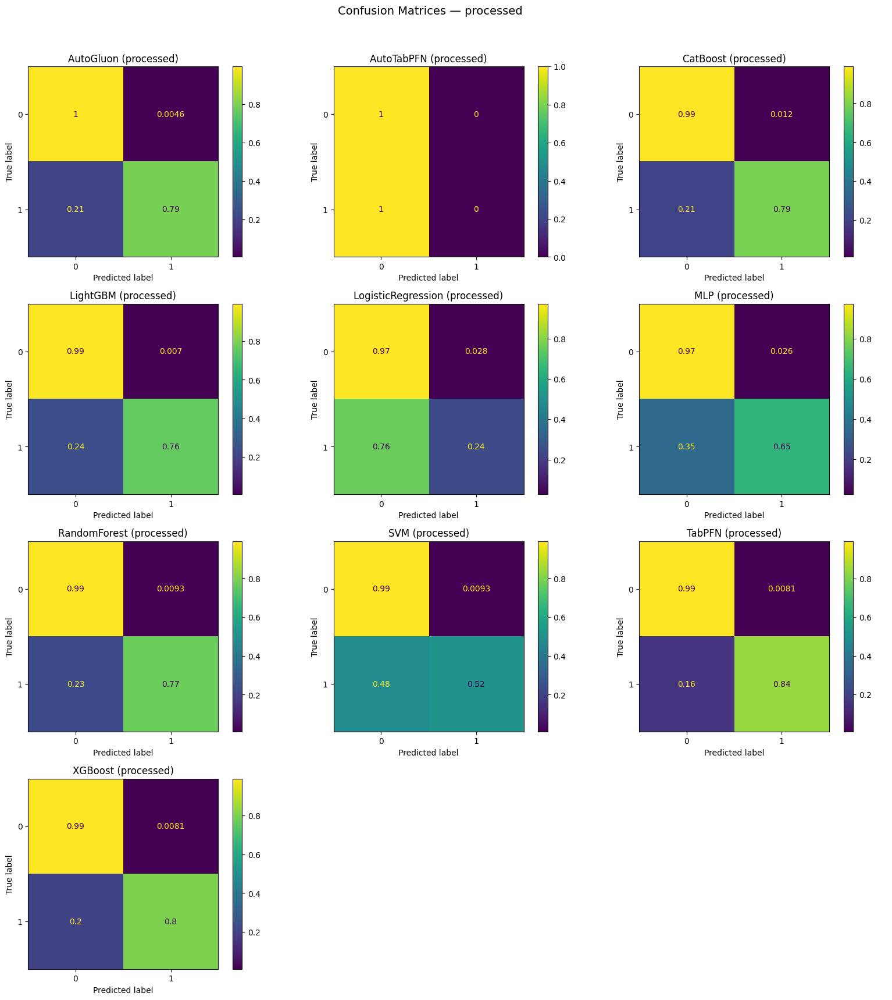

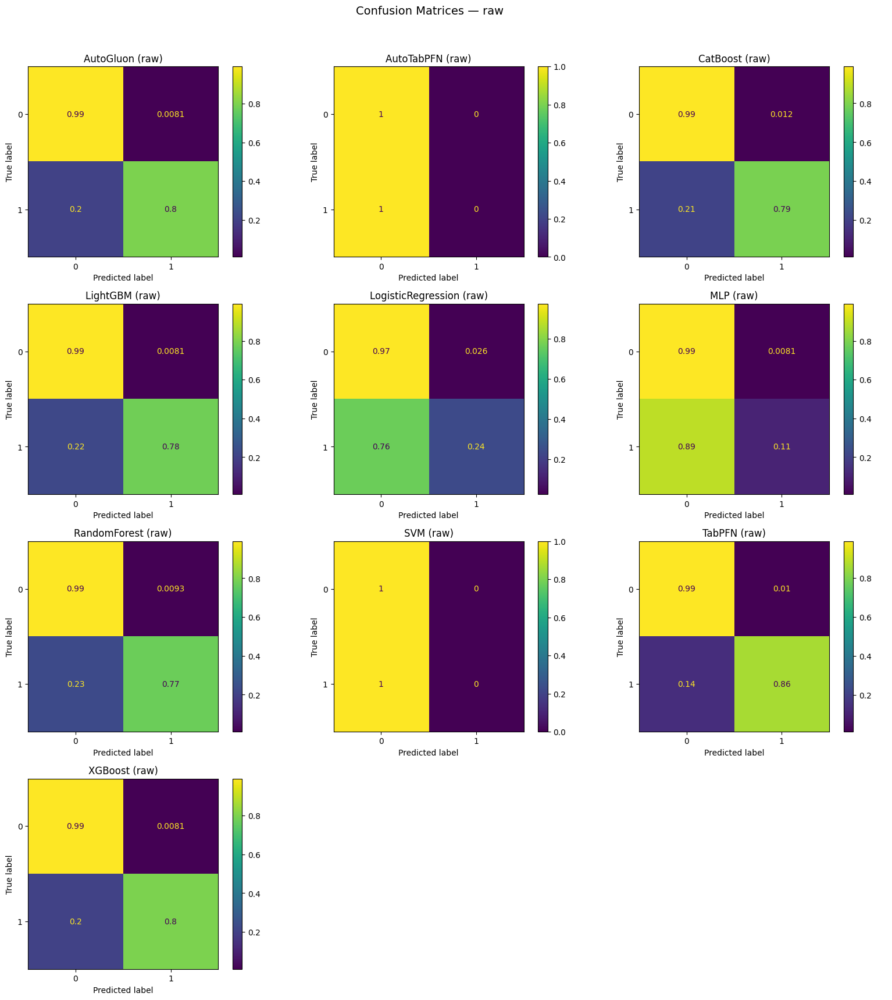

In [22]:
# Confusion Matrices — runs standalone and shows immediately

import numpy as np, pandas as pd, matplotlib.pyplot as plt, warnings
from sklearn.metrics import ConfusionMatrixDisplay
warnings.filterwarnings("ignore")

def _ensure_datasets_local():
    # Use existing `datasets` if present; else build from split vars
    if "datasets" in globals():
        return datasets
    d = {}
    if all(v in globals() for v in ["processed_X_train","processed_X_test","processed_y_train","processed_y_test"]):
        d["processed"] = (processed_X_train, processed_X_test, processed_y_train, processed_y_test)
    if all(v in globals() for v in ["raw_X_train","raw_X_test","raw_y_train","raw_y_test"]):
        d["raw"] = (raw_X_train, raw_X_test, raw_y_train, raw_y_test)
    if not d:
        raise RuntimeError("No datasets found. Define `datasets` or the processed/raw split variables.")
    return d

def _to_1d(a):
    if hasattr(a, "values"): a = a.values
    return np.asarray(a).ravel()

def _make_grid(n, ncols=3, base_h=4.2, width=16):
    nrows = max(1, int(np.ceil(n / ncols)))
    fig, axes = plt.subplots(nrows, ncols, figsize=(width, max(base_h*nrows, 3.5)))
    return fig, (axes.ravel() if hasattr(axes, "ravel") else np.array([axes]))

ds_local = _ensure_datasets_local()
fitted = globals().get("fitted_models", {})

for ds_name in [k for k in ["processed","raw"] if k in ds_local]:
    X_tr, X_te, y_tr, y_te = ds_local[ds_name]
    y_true = _to_1d(y_te)
    keys = sorted([k for k in fitted if k[1] == ds_name], key=lambda x: x[0])

    if not keys:
        print(f"[Confusion] No models found for dataset='{ds_name}'")
        continue

    fig, axes = _make_grid(len(keys), ncols=3, base_h=4.2)
    for ax, (name, _) in zip(axes, keys):
        est = fitted[(name, ds_name)]
        y_pred = _to_1d(est.predict(X_te))
        ConfusionMatrixDisplay.from_predictions(y_true, y_pred, normalize="true", ax=ax)
        ax.set_title(f"{name} ({ds_name})")
    for ax in axes[len(keys):]: ax.axis("off")
    fig.suptitle(f"Confusion Matrices — {ds_name}", y=1.02, fontsize=14)
    plt.tight_layout(); plt.show()

In [23]:
# # Calibration Curves — runs standalone and shows immediately (binary only; skips others)

# import numpy as np, pandas as pd, matplotlib.pyplot as plt, warnings
# from sklearn.calibration import CalibrationDisplay
# warnings.filterwarnings("ignore")

# def _ensure_datasets_local():
#     if "datasets" in globals():
#         return datasets
#     d = {}
#     if all(v in globals() for v in ["processed_X_train","processed_X_test","processed_y_train","processed_y_test"]):
#         d["processed"] = (processed_X_train, processed_X_test, processed_y_train, processed_y_test)
#     if all(v in globals() for v in ["raw_X_train","raw_X_test","raw_y_train","raw_y_test"]):
#         d["raw"] = (raw_X_train, raw_X_test, raw_y_train, raw_y_test)
#     if not d:
#         raise RuntimeError("No datasets found.")
#     return d

# def _to_1d(a):
#     if hasattr(a, "values"): a = a.values
#     return np.asarray(a).ravel()

# def _prob_pos(est, X):
#     try:
#         proba = est.predict_proba(X)
#     except Exception:
#         return None
#     if isinstance(proba, pd.DataFrame):
#         return _to_1d(proba[1]) if 1 in proba.columns else _to_1d(proba.iloc[:, -1])
#     if isinstance(proba, pd.Series):
#         return _to_1d(proba)
#     proba = np.asarray(proba)
#     if proba.ndim == 2 and proba.shape[1] >= 2: return _to_1d(proba[:, -1])
#     if proba.ndim == 1: return _to_1d(proba)
#     return None

# def _make_grid(n, ncols=3, base_h=4.0, width=16):
#     nrows = max(1, int(np.ceil(n / ncols)))
#     fig, axes = plt.subplots(nrows, ncols, figsize=(width, max(base_h*nrows, 3.5)))
#     return fig, (axes.ravel() if hasattr(axes, "ravel") else np.array([axes]))

# ds_local = _ensure_datasets_local()
# fitted = globals().get("fitted_models", {})

# for ds_name in [k for k in ["processed","raw"] if k in ds_local]:
#     X_tr, X_te, y_tr, y_te = ds_local[ds_name]
#     y_true = _to_1d(y_te)
#     is_binary = (np.unique(y_true).size == 2)
#     keys = sorted([k for k in fitted if k[1] == ds_name], key=lambda x: x[0])

#     if not keys:
#         print(f"[Calibration] No models found for dataset='{ds_name}'")
#         continue

#     fig, axes = _make_grid(len(keys), ncols=3, base_h=4.0)
#     for ax, (name, _) in zip(axes, keys):
#         est = fitted[(name, ds_name)]
#         y_prob = _prob_pos(est, X_te)
#         if (not is_binary) or (y_prob is None):
#             ax.text(0.5, 0.5, "Skipped\n(multiclass or no proba)", ha="center", va="center")
#             ax.set_axis_off()
#         else:
#             CalibrationDisplay.from_predictions(y_true, y_prob, n_bins=10, ax=ax)
#             ax.set_title(f"{name} ({ds_name})")
#     for ax in axes[len(keys):]: ax.axis("off")
#     title = f"Calibration Curves — {ds_name}" + ("" if is_binary else " (binary only)")
#     fig.suptitle(title, y=1.02, fontsize=14)
#     plt.tight_layout(); plt.show()

In [24]:
# # Learning Curves — runs standalone and shows immediately (re-fits lightweight models)

# import numpy as np, pandas as pd, matplotlib.pyplot as plt, warnings
# from sklearn.metrics import accuracy_score
# warnings.filterwarnings("ignore")

# def _ensure_datasets_local():
#     if "datasets" in globals():
#         return datasets
#     d = {}
#     if all(v in globals() for v in ["processed_X_train","processed_X_test","processed_y_train","processed_y_test"]):
#         d["processed"] = (processed_X_train, processed_X_test, processed_y_train, processed_y_test)
#     if all(v in globals() for v in ["raw_X_train","raw_X_test","raw_y_train","raw_y_test"]):
#         d["raw"] = (raw_X_train, raw_X_test, raw_y_train, raw_y_test)
#     if not d:
#         raise RuntimeError("No datasets found.")
#     return d

# def _to_1d(a):
#     if hasattr(a, "values"): a = a.values
#     return np.asarray(a).ravel()

# def _ctor_for(name):
#     # Base sklearn models
#     from sklearn.ensemble import RandomForestClassifier
#     from sklearn.svm import SVC
#     from sklearn.neural_network import MLPClassifier
#     from sklearn.linear_model import LogisticRegression
#     mapping = {
#         "RandomForest":       lambda: RandomForestClassifier(random_state=42, n_estimators=200, n_jobs=-1),
#         "SVM":                lambda: SVC(probability=True, random_state=42),
#         "MLP":                lambda: MLPClassifier(hidden_layer_sizes=(100,), max_iter=300, random_state=42),
#         "LogisticRegression": lambda: LogisticRegression(max_iter=1000, solver="lbfgs"),
#     }
#     # Optional extras
#     try:
#         import xgboost as xgb
#         mapping["XGBoost"] = lambda: xgb.XGBClassifier(eval_metric="logloss", random_state=42, tree_method="hist")
#     except Exception: pass
#     try:
#         import lightgbm as lgb
#         mapping["LightGBM"] = lambda: lgb.LGBMClassifier(random_state=42)
#     except Exception: pass
#     try:
#         import catboost as cb
#         mapping["CatBoost"] = lambda: cb.CatBoostClassifier(verbose=False, random_seed=42)
#     except Exception: pass
#     try:
#         from tabpfn import TabPFNClassifier
#         mapping["TabPFN"] = lambda: TabPFNClassifier(random_state=42)
#     except Exception: pass
#     try:
#         from tabpfn_extensions.post_hoc_ensembles.sklearn_interface import AutoTabPFNClassifier
#         mapping["AutoTabPFN"] = lambda: AutoTabPFNClassifier(random_state=42)
#     except Exception: pass
#     # AutoGluon intentionally skipped (non-sklearn API)
#     return mapping.get(name)

# def _make_grid(n, ncols=3, base_h=3.6, width=16):
#     nrows = max(1, int(np.ceil(n / ncols)))
#     fig, axes = plt.subplots(nrows, ncols, figsize=(width, max(base_h*nrows, 3.5)))
#     return fig, (axes.ravel() if hasattr(axes, "ravel") else np.array([axes]))

# ds_local = _ensure_datasets_local()
# fitted = globals().get("fitted_models", {})

# for ds_name in [k for k in ["processed","raw"] if k in ds_local]:
#     X_tr, X_te, y_tr, y_te = ds_local[ds_name]
#     X_tr_np = getattr(X_tr, "values", X_tr)
#     y_tr_np = _to_1d(y_tr)

#     keys = sorted([k for k in fitted if k[1] == ds_name], key=lambda x: x[0])
#     if not keys:
#         print(f"[Learning Curves] No models found for dataset='{ds_name}'")
#         continue

#     steps, min_size, random_state = 8, 32, 42
#     sizes = np.unique(np.clip(np.linspace(min_size, len(X_tr_np), steps, dtype=int), min_size, len(X_tr_np)))

#     fig, axes = _make_grid(len(keys), ncols=3, base_h=3.6)
#     rng = np.random.RandomState(random_state)

#     for ax, (name, _) in zip(axes, keys):
#         ctor = _ctor_for(name)
#         if ctor is None or name == "AutoGluon":
#             ax.text(0.5, 0.5, "Skipped", ha="center", va="center"); ax.set_axis_off(); continue
#         train_scores, test_scores = [], []
#         for n in sizes:
#             idx = rng.permutation(len(X_tr_np))[:n]
#             est = ctor()
#             Xn = X_tr_np[idx] if hasattr(X_tr_np, "__getitem__") else X_tr.iloc[idx]
#             yn = y_tr_np[idx]
#             try:
#                 est.fit(Xn, yn)
#                 tr_pred = _to_1d(est.predict(Xn))
#                 te_pred = _to_1d(est.predict(X_te))
#                 train_scores.append(accuracy_score(yn, tr_pred))
#                 test_scores.append(accuracy_score(_to_1d(y_te), te_pred))
#             except Exception:
#                 train_scores.append(np.nan); test_scores.append(np.nan)
#         ax.plot(sizes, train_scores, "o-", label="Train")
#         ax.plot(sizes, test_scores, "o-", label="Test")
#         ax.set_title(f"{name} ({ds_name})"); ax.set_xlabel("Train size"); ax.set_ylabel("Accuracy"); ax.legend()
#     for ax in axes[len(keys):]: ax.axis("off")
#     plt.suptitle(f"Learning Curves — {ds_name}", y=1.02, fontsize=14)
#     plt.tight_layout(); plt.show()

In [25]:
# # Probability Invariance — runs standalone and shows immediately
# # Compares P(class=1) from each model on raw vs processed test sets.

# import numpy as np, pandas as pd, matplotlib.pyplot as plt, warnings
# warnings.filterwarnings("ignore")

# def _ensure_datasets_local():
#     if "datasets" in globals():
#         return datasets
#     d = {}
#     if all(v in globals() for v in ["processed_X_train","processed_X_test","processed_y_train","processed_y_test"]):
#         d["processed"] = (processed_X_train, processed_X_test, processed_y_train, processed_y_test)
#     if all(v in globals() for v in ["raw_X_train","raw_X_test","raw_y_train","raw_y_test"]):
#         d["raw"] = (raw_X_train, raw_X_test, raw_y_train, raw_y_test)
#     if not d:
#         raise RuntimeError("Need both 'raw' and 'processed' to run probability invariance.")
#     return d

# def _to_1d(a):
#     if hasattr(a, "values"): a = a.values
#     return np.asarray(a).ravel()

# def _prob_pos(est, X):
#     try:
#         proba = est.predict_proba(X)
#     except Exception:
#         return None
#     if isinstance(proba, pd.DataFrame):
#         return _to_1d(proba[1]) if 1 in proba.columns else _to_1d(proba.iloc[:, -1])
#     if isinstance(proba, pd.Series):
#         return _to_1d(proba)
#     proba = np.asarray(proba)
#     if proba.ndim == 2 and proba.shape[1] >= 2: return _to_1d(proba[:, -1])
#     if proba.ndim == 1: return _to_1d(proba)
#     return None

# def _make_grid(n, ncols=3, base_h=3.8, width=16):
#     nrows = max(1, int(np.ceil(n / ncols)))
#     fig, axes = plt.subplots(nrows, ncols, figsize=(width, max(base_h*nrows, 3.5)))
#     return fig, (axes.ravel() if hasattr(axes, "ravel") else np.array([axes]))

# ds_local = _ensure_datasets_local()
# if not ("raw" in ds_local and "processed" in ds_local):
#     raise RuntimeError("Need both 'raw' and 'processed' in datasets for probability invariance.")

# _, X_te_p, _, _ = ds_local["processed"]
# _, X_te_r, _, _ = ds_local["raw"]
# fitted = globals().get("fitted_models", {})

# names = sorted(set(n for (n,d) in fitted if d == "raw") & set(n for (n,d) in fitted if d == "processed"))
# if not names:
#     print("No overlapping models across raw and processed.")
# else:
#     fig, axes = _make_grid(len(names), ncols=3, base_h=3.8)
#     for ax, name in zip(axes, names):
#         est_p = fitted.get((name, "processed"))
#         est_r = fitted.get((name, "raw"))
#         if est_p is None or est_r is None:
#             ax.text(0.5, 0.5, "Missing model", ha="center", va="center"); ax.set_axis_off(); continue
#         p_p = _prob_pos(est_p, X_te_p)
#         p_r = _prob_pos(est_r, X_te_r)
#         if p_p is None or p_r is None:
#             ax.text(0.5, 0.5, "No probabilities", ha="center", va="center"); ax.set_axis_off(); continue

#         m = min(len(p_p), len(p_r))
#         p_p, p_r = np.asarray(p_p)[:m], np.asarray(p_r)[:m]
#         ax.scatter(p_r, p_p, s=10, alpha=0.5)
#         ax.plot([0,1], [0,1], "--", lw=1)
#         with np.errstate(invalid="ignore"):
#             corr = np.corrcoef(p_r, p_p)[0,1]
#             mae  = float(np.nanmean(np.abs(p_p - p_r)))
#         ax.set_title(f"{name}\nρ={corr:.3f}, MAE={mae:.3f}")
#         ax.set_xlabel("P(1) — raw"); ax.set_ylabel("P(1) — processed")
#     for ax in axes[len(names):]: ax.axis("off")
#     plt.suptitle("Probability Invariance — Raw vs Processed (per model)", y=1.02, fontsize=14)
#     plt.tight_layout(); plt.show()


# 🔧 Hyperparameter Tuning Add‑On (Paper‑aligned search spaces)

This section **keeps your existing code** and **adds** optional hyperparameter tuning for baselines,
using ranges inspired by the TabPFN paper's baseline search spaces (MLP, RF, SVM, CatBoost, XGBoost, LightGBM).  
- Uses `RandomizedSearchCV` with log‑uniform/uniform distributions.  
- You can control the number of iterations per model via `N_ITER` (or set per‑model).  
- Works with your existing dataset variables (`X_train`, `X_test`, `y_train`, `y_test`) and your preprocessing choices.

> Tip: If your data pipeline variables are named differently, just adapt the `X_train`, `X_test`, `y_train`, `y_test` references below.


In [29]:
# %% [hparam-setup] Imports and helpers for tuning
import numpy as np
import pandas as pd
import warnings, time
from scipy.stats import loguniform, randint, uniform
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score, roc_auc_score, log_loss

# Try to import all models here (some may already be imported in your earlier cells)
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression

import xgboost as xgb
import lightgbm as lgb
import catboost as cb

warnings.filterwarnings("ignore")

def safe_proba(estimator, X):
    try:
        p = estimator.predict_proba(X)
        return p.values if isinstance(p, pd.DataFrame) else np.asarray(p)
    except Exception:
        return None

def multi_roc_auc(y_true, y_prob):
    if y_prob is None: return np.nan
    if (y_prob.ndim == 1) or (y_prob.shape[1] == 2):
        pos = y_prob[:, 1] if y_prob.ndim > 1 else y_prob
        return roc_auc_score(y_true, pos)
    return roc_auc_score(y_true, y_prob, multi_class="ovr")

In [30]:
# %% [fix-labels] Ensure labels are 0..K-1 for all models
from sklearn.preprocessing import LabelEncoder
import numpy as np
import pandas as pd

def encode_labels(y_train, y_test):
    y_train = pd.Series(y_train).astype("category")
    y_test  = pd.Series(y_test).astype("category")
    le = LabelEncoder()
    y_tr = le.fit_transform(y_train)
    y_te = le.transform(y_test)
    return y_tr, y_te, le

processed_y_train_enc, processed_y_test_enc, le = encode_labels(processed_y_train, processed_y_test)
n_classes = len(le.classes_)

print(f"Encoded classes: {list(le.classes_)} -> 0..{n_classes-1}")

Encoded classes: [0, 1] -> 0..1


In [31]:
print(processed_y_train_enc)

[0 1 0 ... 0 0 0]


In [32]:
# %% [hparam-spaces] Paper-inspired search spaces
# Ranges roughly mirror the figure you referenced.
search_spaces = {
    "MLP": {
        "hidden_layer_sizes": [(h,) for h in [64, 128, 256]] + [(128, 64), (256, 128), (256, 128, 64)],  # 1–3 layers
        "activation": ["relu", "tanh"],
        "alpha": loguniform(1e-7, 1e-1),
        "learning_rate_init": loguniform(1e-4, 10**-0.5),
        "early_stopping": [True, False],
        "max_iter": [300, 500, 800]
    },
    "RandomForest": {
        "n_estimators": randint(20, 201),
        "max_depth": randint(1, 46),
        "min_samples_split": [2, 5, 10],
        "max_features": ["sqrt", "log2", None]
    },
    "SVC": {
        "C": loguniform(1e-1, 1e2),      # {0.1,1,10,100} ~ log‑uniform
        "gamma": ["scale", "auto"],
        "kernel": ["rbf", "poly", "sigmoid"],
        "probability": [True]            # ensure probabilities
    },
    "CatBoost": {
        "learning_rate": loguniform(1e-5, 1),
        "depth": randint(3, 11),
        "l2_leaf_reg": loguniform(1, 10),
        "random_strength": randint(1, 21),
        "bagging_temperature": uniform(0.0, 1.0),
        "iterations": randint(100, 4001)
    },
    "XGBoost": {
        "learning_rate": loguniform(1e-7, 1),
        "max_depth": randint(1, 11),
        "subsample": uniform(0.2, 0.8),
        "colsample_bytree": uniform(0.2, 0.8),
        "colsample_bylevel": uniform(0.2, 0.8),
        "min_child_weight": loguniform(1e-16, 1e5),
        "alpha": loguniform(1e-16, 1e2),
        "lambda": loguniform(1e-16, 1e2),
        "gamma": loguniform(1e-16, 1e2),
        "n_estimators": randint(100, 4001)
    },
    "LightGBM": {
        "num_leaves": randint(5, 51),
        "max_depth": randint(3, 21),
        "learning_rate": loguniform(1e-3, 1),
        "n_estimators": randint(50, 2001),
        "min_child_weight": [1e-5, 1e-3, 1e-2, 1e-1, 1, 10, 1e2, 1e3, 1e4],
        "subsample": uniform(0.2, 0.6),            # 0.2–0.8
        "colsample_bytree": uniform(0.2, 0.6),     # 0.2–0.8
        "reg_alpha": [0, 1, 2, 5, 7, 10, 50, 100],
        "reg_lambda": [0, 1, 2, 5, 7, 10, 50, 100]
    }
}

In [35]:
# %% [hparam-run] Run tuning (set N_ITER per model)
# Assumes you already have X_train, X_test, y_train, y_test from your previous cells.
# If your variable names differ, adapt here.

N_ITER = {
    "MLP": 25,
    "RandomForest": 25,
    "SVC": 25,
    "CatBoost": 25,
    "XGBoost": 25,
    "LightGBM": 25,
}

# Base estimators (sklearn-compatible)
estimators = {
    "MLP": MLPClassifier(random_state=42),
    "RandomForest": RandomForestClassifier(random_state=42, n_jobs=-1),
    "SVC": SVC(random_state=42),
    "CatBoost": cb.CatBoostClassifier(verbose=False, random_seed=42),
    "XGBoost": xgb.XGBClassifier(use_label_encoder=False, eval_metric="logloss", random_state=42, tree_method="hist"),
    "LightGBM": lgb.LGBMClassifier(random_state=42)
}

results_hpo = []

for name, est in estimators.items():
    print(f"Tuning {name} ...")
    space = search_spaces[name]
    n_iter = N_ITER.get(name, 20)
    rs = RandomizedSearchCV(
        estimator=est,
        param_distributions=space,
        n_iter=n_iter,
        scoring="roc_auc_ovr",   # robust across binary/multiclass
        cv=3,
        n_jobs=-1,
        verbose=1,
        random_state=42,
        refit=True
    )
    t0 = time.time()
    rs.fit(processed_X_train, processed_y_train_enc)
    fit_s = time.time() - t0

    best = rs.best_estimator_
    yhat = best.predict(processed_X_test)
    yprob = safe_proba(best, processed_X_test)

    row = dict(
        model=f"{name} (tuned)",
        acc=accuracy_score(processed_y_test_enc, yhat),
        roc_auc=multi_roc_auc(processed_y_test_enc, yprob),
        logloss=(log_loss(processed_y_test_enc, yprob) if yprob is not None else np.nan),
        fit_s=fit_s,
        best_params=rs.best_params_
    )
    results_hpo.append(row)

results_hpo = pd.DataFrame(results_hpo).sort_values(["roc_auc","acc"], ascending=[False, False]).reset_index(drop=True)
results_hpo

Tuning MLP ...
Fitting 3 folds for each of 25 candidates, totalling 75 fits
Tuning RandomForest ...
Fitting 3 folds for each of 25 candidates, totalling 75 fits
Tuning SVC ...
Fitting 3 folds for each of 25 candidates, totalling 75 fits
Tuning CatBoost ...
Fitting 3 folds for each of 25 candidates, totalling 75 fits
Tuning XGBoost ...
Fitting 3 folds for each of 25 candidates, totalling 75 fits


/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [07:53:09] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [07:53:09] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [07:53:09] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [07:53:09] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [07:53:15] WARNING: /w

Tuning LightGBM ...
Fitting 3 folds for each of 25 candidates, totalling 75 fits
[LightGBM] [Info] Number of positive: 378, number of negative: 2288
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000719 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2707
[LightGBM] [Info] Number of data points in the train set: 2666, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.141785 -> initscore=-1.800539
[LightGBM] [Info] Start training from score -1.800539
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightG

,model,acc,roc_auc,logloss,fit_s,best_params
0,RandomForest (tuned),0.959,0.921766,0.176578,43.095495,"{'max_depth': 39, 'max_features': 'sqrt', 'min_samples_split': 10, 'n_estimators': 126}"
1,LightGBM (tuned),0.963,0.920621,0.180812,41.995604,"{'colsample_bytree': 0.7067203092068908, 'learning_rate': 0.17456626922659324, 'max_depth': 17, 'min_child_weight': 1, 'n_estimators': 841, 'num_leaves': 30, 'reg_alpha': 0, 'reg_lambda': 5, 'subsample': 0.5642205486120109}"
2,XGBoost (tuned),0.861,0.917454,0.251579,82.669768,"{'alpha': 1.8534955142121485e-06, 'colsample_bylevel': 0.6166674080206589, 'colsample_bytree': 0.9689376194794794, 'gamma': 0.1590776901197357, 'lambda': 0.0028298406606801236, 'learning_rate': 0.000599576947438695, 'max_depth': 8, 'min_child_weight': 3.1032721261344543e-09, 'n_estimators': 863, 'subsample': 0.6856273981493477}"
3,CatBoost (tuned),0.962,0.913510,0.152538,1296.747726,"{'bagging_temperature': 0.2017192023353962, 'depth': 10, 'iterations': 2890, 'l2_leaf_reg': 2.9879286542298455, 'learning_rate': 0.006552059910868994, 'random_strength': 4}"
4,SVC (tuned),0.911,0.911242,0.208411,24.433839,"{'C': 0.4335281794951565, 'gamma': 'auto', 'kernel': 'rbf', 'probability': True}"
5,MLP (tuned),0.941,0.906166,0.180264,94.158977,"{'activation': 'relu', 'alpha': 0.06569128640939181, 'early_stopping': False, 'hidden_layer_sizes': (128, 64), 'learning_rate_init': 0.19419868977616675, 'max_iter': 500}"


In [36]:
# %% [hparam-save] Save tuned results and params
out_csv = "cmc_hparam_tuned_results.csv"
results_hpo.to_csv(out_csv, index=False)
print("Saved tuned results to:", out_csv)

# Pretty print best params for quick copy-paste
for i, r in results_hpo.iterrows():
    print("\n===", r["model"], "===")
    for k, v in r["best_params"].items():
        print(f"{k}: {v}")

Saved tuned results to: cmc_hparam_tuned_results.csv

=== RandomForest (tuned) ===
max_depth: 39
max_features: sqrt
min_samples_split: 10
n_estimators: 126

=== LightGBM (tuned) ===
colsample_bytree: 0.7067203092068908
learning_rate: 0.17456626922659324
max_depth: 17
min_child_weight: 1
n_estimators: 841
num_leaves: 30
reg_alpha: 0
reg_lambda: 5
subsample: 0.5642205486120109

=== XGBoost (tuned) ===
alpha: 1.8534955142121485e-06
colsample_bylevel: 0.6166674080206589
colsample_bytree: 0.9689376194794794
gamma: 0.1590776901197357
lambda: 0.0028298406606801236
learning_rate: 0.000599576947438695
max_depth: 8
min_child_weight: 3.1032721261344543e-09
n_estimators: 863
subsample: 0.6856273981493477

=== CatBoost (tuned) ===
bagging_temperature: 0.2017192023353962
depth: 10
iterations: 2890
l2_leaf_reg: 2.9879286542298455
learning_rate: 0.006552059910868994
random_strength: 4

=== SVC (tuned) ===
C: 0.4335281794951565
gamma: auto
kernel: rbf
probability: True

=== MLP (tuned) ===
activation: 